In [1]:
###################################################################################
# OpenBikeSensor analysis with a Jupyter notebook
###################################################################################

# Idea from TH Wildau:
# - https://github.com/radverkehr/OpenBikeSensor_Analysis/blob/gh-pages/code/obs_publicData_leftRight_v02.ipynb


In [2]:
# Known issues:
# * Use color defined in streets in the histogramms

In [3]:
# Install custom packages
#%pip install <<package>>

In [4]:
###################################################################################
# Imports
###################################################################################

import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import math
import datetime
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon
from datetime import datetime
import requests
import seaborn as sns

In [5]:
###################################################################################
# Configure
###################################################################################

# Save all figures and maps to `output/`?
savefig = False

# Figure size
figsize_rect = (16,9)
figsize_square = (9,9)

###################################################################################
# Configure Groups
###################################################################################

# cardinal direction (in german)
dirs = ['O', 'ONO', 'NO', 'NNO', 'N', 'NNW', 'NW', 'WNW', 'W', 'WSW', 'SW', 'SSW', 'S', 'SSO', 'SO', 'OSO']

# Group of left-distances
left_labels = ['0-50', '50-100', '100-150', '150-200', '200-250', '250-300']
left_bins = [0, 50, 100, 150, 200, 250, 300]

# Group of left-distances
right_labels = ['<20','20-40','40-60','60-80','80-100','100-120','120-140','140-160','160-180','180-200']
right_bins = [0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200]

# Group of speeds
speed_labels = ['0-5', '5-10', '10-15', '15-20', '20-25', '25-30', '30-35', '35-40']
speed_bins = [-1, 5, 10, 15, 20, 25, 30, 35, 40] ## some 0s are not 0, this we start at -1

###################################################################################
# Configure title and labels (in german)
###################################################################################

label_distance_stationary="Abstand nach Rechts (cm)"
label_distance_overtaker="Überholabstand (cm)"
label_street="Straße"
label_speed="Geschwindigkeit (km/h)"
label_driving_direction="Fahrtrichtung"
label_counter="Anzahl"
label_selected_street="Ausgewählte Straßen"

###################################################################################
# Date
###################################################################################

dateTimeObj = datetime.now();

# Used on the plots
dateStr = dateTimeObj.strftime("%Y-%m-%d")

# Used to save the portal JSON
timestampStr = dateTimeObj.strftime("%Y-%m-%d_%H:%M:%S")


In [6]:
###################################################################################
# Classes
###################################################################################

class Drivingdirection:
    def __init__(self, name, directions):
        # Name of the Direction
        self.name = name
        # List of dire
        self.directions = directions

class Street:
    def __init__(self, name, file, color, directions):
        # Name of the street
        self.name = name
        # A pre-defined color, can be used on the map
        self.color = color
        # Read the file with GeoPandas
        self.geojson = gpd.read_file(file)
        # Create a folium layer, based on the GeoPanda-data
        self.layer = folium.GeoJson(data=self.geojson, style_function=lambda x: {
          'color' :  self.color,
          'opacity' : 0.50, # The layer has an opacity of 50%
          'weight' : 2,
        })
        # Convert MULTIPOLYGON to POLYGON
        # https://stackoverflow.com/a/68922148/605890
        # This poylgon in required to map the data points to the polygon
        self.poly = self.geojson.geometry.explode(ignore_index=True)[0]
        # A street can have a bunch of directions
        self.directions = directions

    # Add the layer of the street to the map
    def add_layer_to_map(self, map):
        self.layer.add_to(map)        

class City:
    def __init__(self, name, lat, lng, portal_url, streets):
        # Name of the city
        self.name = name
        # Lat
        self.lat = lat
        # Lng
        self.lng = lng   
        # The URL of the portal export
        self.portal_url = portal_url
        # A list of streets
        self.streets = streets

    # Create a map of the city
    def get_map(self):
        return folium.Map(location=[self.lat, self.lng], zoom_start=14, tiles='CartoDB positron', width=1600, height=900)

In [7]:
###################################################################################
# Streets
###################################################################################

# Colors names
# https://www.w3schools.com/tags/ref_colornames.asp

darmstadt = City(
    "Darmstadt",
    49.8691,
    8.6462,
    "https://obs.adfc-darmstadt.de/api/export/events?bbox=8.567431969029464,49.91019440488624,8.722329198079821,49.83504493989966&fmt=geojson",
    [
        Street("Bismarkstraße", "cities/darmstadt/geojson/Bismarkstraße.geojson", "Fuchsia", [
            Drivingdirection("West", ["WNW", "W", "WSW", "SSW"]),
            Drivingdirection("Ost", ["ONO", "O", "OSO", "SO"]),
        ]),
    ]
)

stuttgart = City(
    "Stuttgart",
    48.737,
    9.145,
    "https://obs.adfc-bw.de/api/export/events?bbox=9.221221838044663,48.792519806415775,9.117047046995465,48.73117370876395&fmt=geojson",
    [
         Street("Kaltental", "cities/stuttgart/geojson/Kaltental.geojson", "blue", [
             Drivingdirection("Nord", ["NNO", "NO", "ONO"]),
             Drivingdirection("Süd", ["S", "SSW", "SW", "WSW"]),
        ]),
    ]
)

luebeck = City(
    "Lübeck",
    53.8656,
    10.6916,
    "https://obs.adfc-luebeck.de/api/export/events?bbox=10.878386408372855,53.77758626995254,10.596441559351634,53.908166414067004&fmt=geojson",
    [
        Street("Fackenburger Allee", "cities/luebeck/geojson/Fackenburger.geojson", "red", [
            Drivingdirection("Stadteinwärts (Radfahrstreifen, 50km/h)", ["SSW", "S", "SSO", "SO", "OSO"]),
            Drivingdirection("Stadtauswärts (Radfahrstreifen, 50km/h)", ["NW", "NNW", "N", "NNO"])
        ]),
        Street("Mönkhofer Weg", "cities/luebeck/geojson/Mönkhofer.geojson", "green", [
           Drivingdirection("Nord (Schutzstreifen, 50km/h)", ["WNW", "NW", "NNW", "N", "NNO", "NO"]),
           Drivingdirection("Süd (Schutzstreifen, 50km/h)", ["SW", "SSW", "S", "SSO", "SO", "OSO"])        
        ]),
        Street("Hansestraße", "cities/luebeck/geojson/Hansestraße.geojson", "Cyan", [
            Drivingdirection("Ost (Mischverkehr, 50km/h)", ["SO", "OSO", "O", "ONO", "NO", "NNO"]),
            Drivingdirection("West (Mischverkehr, 50km/h)", ["SSW", "SW", "WSW", "W"]),
        ]),
        Street("Roeckstraße", "cities/luebeck/geojson/Roeckstraße.geojson", "yellow", [
            Drivingdirection("Ost (Mischverkehr, 30km/h)", ["O", "OSO", "SO"]),
            Drivingdirection("West (Mischverkehr), 30km/h", ["SW", "WSW", "W", "WNW"]),
        ]),
        Street("Wisbystraße", "cities/luebeck/geojson/Wisbystraße.geojson", "Chocolate", [
           Drivingdirection("Nord (Schutzstreifen, 50km/h)", ["WNW", "NW", "NNW", "N", "NNO"]),
           Drivingdirection("Süd (Mischverkehr, 50km/h)", ["S", "SSO", "SO", "OSO"]),
        ]),
        # Street("Kanalstraße", "cities/luebeck/geojson/Kanalstraße.geojson", "DarkMagenta", [
        #    Drivingdirection("Nord (Radfahrstreifen)", ["NW", "NNW", "N", "NNO", "NO"]),
        #    Drivingdirection("Süd (Radfahrstreifen)", ["SW","SSW", "S", "SSO", "SO"]),
        # ]),
        # Street("Untertrave", "cities/luebeck/geojson/Untertrave.geojson", "grey", [
        #    Drivingdirection("Nord/Ost (Schutzstreifen)", ["N", "NNO", "NO", "ONO", "O"]),
        #    Drivingdirection("Süd/West (Schutzstreifen)", ["W", "WSW", "SW", "SSW", "S"]),       
        # ]),
        # Street("Mühlenstraße", "cities/luebeck/geojson/Mühlenstraße.geojson", "Fuchsia", [
        #     Drivingdirection("Stadtauswärts", ["SSO", "SO", "S"]),
        #     Drivingdirection("Stadteinwärts", ["NW", "NNW", "N", "NO"]),
        # ]),
        # Street("Marienbrücke", "cities/luebeck/geojson/Marienbrücke.geojson", "GreenYellow", [
        #     Drivingdirection("Stadtauswärts", ["NW"]),
        #     Drivingdirection("Stadteinwärts", ["SO"]),
        # ]),
        # Street("Fregattenstrasse", "cities/luebeck/geojson/Fregattenstrasse.geojson", "BlueViolet", [
        #     Drivingdirection("Nord", ["WNW", "NW", "NNW", "N", "NNO", "NO"]),
        #     Drivingdirection("Süd", ["SW", "SSW", "S", "SSO", "SO", "OSO", "O"]),
        # ]),
    ]    
)

# Select city
city = luebeck
# city = stuttgart
# city = darmstadt


In [8]:
###################################################################################
# Load OBS data from portal
###################################################################################

# Save the file
filename = "download/geojson/" + city.name + "_" + timestampStr + ".geojson"
print(filename)

# Load geojson from HTTP and write to file
response = requests.get(city.portal_url)

open(filename, "wb").write(response.content)

# Load the file
obs_geojson_file = gpd.read_file(filename)
obs_geojson_file


download/geojson/Lübeck_2022-12-08_23:12:34.geojson


,distance_overtaker,distance_stationary,direction,way_id,course,speed,time,geometry
0,1.45,1.04,1,151585372.0,2.018461,2.611111,2021-08-12 10:50:39+00:00,POINT (10.68040 53.86625)
1,0.43,2.19,-1,151583595.0,1.679533,3.444444,2021-08-12 10:50:51+00:00,POINT (10.68072 53.86681)
2,1.43,1.35,-1,506755254.0,1.279064,5.111111,2021-08-12 10:52:09+00:00,POINT (10.68009 53.87008)
3,2.23,0.47,-1,506755254.0,1.140099,4.888889,2021-08-12 10:52:13+00:00,POINT (10.68020 53.87025)
4,1.53,0.87,-1,38522776.0,1.062453,4.722222,2021-08-12 10:52:17+00:00,POINT (10.68034 53.87042)
...,...,...,...,...,...,...,...,...
3762,0.01,0.57,-1,4100193.0,4.008526,0.944444,2022-12-04 09:17:33+00:00,POINT (10.69463 53.86898)
3763,1.23,NaN,1,38534482.0,2.423790,5.138889,2022-12-04 11:02:36+00:00,POINT (10.69179 53.87436)
3764,2.13,NaN,-1,143448486.0,3.636088,6.500000,2022-12-04 11:04:38+00:00,POINT (10.68703 53.87368)
3765,1.84,1.58,-1,143448486.0,3.667841,6.194444,2022-12-04 11:04:41+00:00,POINT (10.68677 53.87362)


In [9]:
###################################################################################
# Prepare OBS data
###################################################################################

# Copy the data, since modifin them can create errors
obs_geojson = obs_geojson_file.copy()

# Convert distances from "m" to "cm"
obs_geojson['distance_overtaker'] = obs_geojson['distance_overtaker'] * 100
obs_geojson['distance_stationary'] = obs_geojson['distance_stationary'] * 100

# Drop all data, where distance_overtaker < 10cm
# See notenook from TH Wildau
obs_geojson = obs_geojson[(obs_geojson.distance_overtaker>10)]

# Group distance_overtaker
obs_geojson['left_label'] = pd.cut(obs_geojson['distance_overtaker'], left_bins, labels=left_labels)

# Convert from m/s to km/h
obs_geojson = obs_geojson.dropna(subset=['speed'])
obs_geojson["speed_kmh"] = obs_geojson["speed"] * 3.6;

# Group speed_kmh
obs_geojson['speed_kmh_label'] = pd.cut(obs_geojson['speed_kmh'], speed_bins, labels=speed_labels)

# Map points within the street polygons to the streets names
def get_street(geometry):
    for s in city.streets:
        # Check, if point is within the polygon of the street
        if (geometry.within(s.poly)):
            return s.name;
    return "n/a";
obs_geojson = obs_geojson.copy().assign(
    street = obs_geojson.geometry.apply(lambda x: get_street(x))
)

# Convert course to degree
obs_geojson["deg"] = round((obs_geojson["course"] / math.pi) * 180);
# Convert degree to cardinal
# https://de.wikipedia.org/wiki/Himmelsrichtung
# https://gist.github.com/RobertSudwarts/acf8df23a16afdb5837f
obs_geojson["ix"] = obs_geojson["deg"].apply(lambda x: x / (360. / len(dirs) ))
obs_geojson = obs_geojson.dropna(subset=['ix'])
obs_geojson["ix"] = obs_geojson["ix"].astype('int64')
obs_geojson["cardinal"] = obs_geojson["ix"].apply(lambda ix: dirs[(ix % len(dirs))])
obs_geojson = obs_geojson.drop(['ix'], axis=1) # drop ix helper

# Map the cardinal to the a human readable driving direction
def driving_direction(x):
    x['driving_direction'] = "n/a"
    # For debugging of driving_directions
    # x['driving_direction'] = x.cardinal 
    # Iterate all streets of the city...
    for s in city.streets:
        # when the name matches...
        if (s.name == x.street):
            # get all direction...
            for d in s.directions:
                # if the cardinal is part of the direction, the set the driving direction
                if x.cardinal in d.directions:
                    x['driving_direction'] = d.name
    return x
obs_geojson = obs_geojson.apply(driving_direction, axis=1)

# Print all data points with distance_overtaker > 10
obs_geojson

,distance_overtaker,distance_stationary,direction,way_id,course,speed,time,geometry,left_label,speed_kmh,speed_kmh_label,street,deg,cardinal,driving_direction
0,145.0,104.0,1,151585372.0,2.018461,2.611111,2021-08-12 10:50:39+00:00,POINT (10.68040 53.86625),100-150,9.4,5-10,n/a,116.0,NNW,n/a
1,43.0,219.0,-1,151583595.0,1.679533,3.444444,2021-08-12 10:50:51+00:00,POINT (10.68072 53.86681),0-50,12.4,10-15,n/a,96.0,N,n/a
2,143.0,135.0,-1,506755254.0,1.279064,5.111111,2021-08-12 10:52:09+00:00,POINT (10.68009 53.87008),100-150,18.4,15-20,n/a,73.0,NNO,n/a
3,223.0,47.0,-1,506755254.0,1.140099,4.888889,2021-08-12 10:52:13+00:00,POINT (10.68020 53.87025),200-250,17.6,15-20,n/a,65.0,NO,n/a
4,153.0,87.0,-1,38522776.0,1.062453,4.722222,2021-08-12 10:52:17+00:00,POINT (10.68034 53.87042),150-200,17.0,15-20,n/a,61.0,NO,n/a
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3761,203.0,58.0,-1,4100193.0,3.978610,1.583333,2022-12-04 09:17:17+00:00,POINT (10.69466 53.86898),200-250,5.7,5-10,n/a,228.0,SW,n/a
3763,123.0,NaN,1,38534482.0,2.423790,5.138889,2022-12-04 11:02:36+00:00,POINT (10.69179 53.87436),100-150,18.5,15-20,n/a,139.0,NW,n/a
3764,213.0,NaN,-1,143448486.0,3.636088,6.500000,2022-12-04 11:04:38+00:00,POINT (10.68703 53.87368),200-250,23.4,20-25,n/a,208.0,WSW,n/a
3765,184.0,158.0,-1,143448486.0,3.667841,6.194444,2022-12-04 11:04:41+00:00,POINT (10.68677 53.87362),150-200,22.3,20-25,n/a,210.0,WSW,n/a


In [10]:
###################################################################################
# Print all mapped streets without driving_direction (e.g, cardinal cannot be mapped)
# This usually happens, when the cardinal is east/west, but the steet direction is noth/south, thus it cannot be mapped
###################################################################################

obs_geojson[((obs_geojson.street != "n/a") & (obs_geojson.driving_direction == "n/a"))]

,distance_overtaker,distance_stationary,direction,way_id,course,speed,time,geometry,left_label,speed_kmh,speed_kmh_label,street,deg,cardinal,driving_direction
773,111.0,78.0,1,154005172.0,2.084218,0.916667,2022-08-10 15:59:26+00:00,POINT (10.66433 53.86218),100-150,3.3,0-5,Hansestraße,119.0,NNW,n/a
778,114.0,106.0,1,729344673.0,1.593954,0.916667,2022-08-10 16:02:04+00:00,POINT (10.66998 53.86501),100-150,3.3,0-5,Hansestraße,91.0,N,n/a


In [11]:
###################################################################################
# Remove all mapped streets without driving_directions (see above)
###################################################################################

# https://stackoverflow.com/a/31794990/605890
obs_geojson = obs_geojson[~((obs_geojson.street != "n/a") & (obs_geojson.driving_direction == "n/a"))]
obs_geojson

,distance_overtaker,distance_stationary,direction,way_id,course,speed,time,geometry,left_label,speed_kmh,speed_kmh_label,street,deg,cardinal,driving_direction
0,145.0,104.0,1,151585372.0,2.018461,2.611111,2021-08-12 10:50:39+00:00,POINT (10.68040 53.86625),100-150,9.4,5-10,n/a,116.0,NNW,n/a
1,43.0,219.0,-1,151583595.0,1.679533,3.444444,2021-08-12 10:50:51+00:00,POINT (10.68072 53.86681),0-50,12.4,10-15,n/a,96.0,N,n/a
2,143.0,135.0,-1,506755254.0,1.279064,5.111111,2021-08-12 10:52:09+00:00,POINT (10.68009 53.87008),100-150,18.4,15-20,n/a,73.0,NNO,n/a
3,223.0,47.0,-1,506755254.0,1.140099,4.888889,2021-08-12 10:52:13+00:00,POINT (10.68020 53.87025),200-250,17.6,15-20,n/a,65.0,NO,n/a
4,153.0,87.0,-1,38522776.0,1.062453,4.722222,2021-08-12 10:52:17+00:00,POINT (10.68034 53.87042),150-200,17.0,15-20,n/a,61.0,NO,n/a
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3761,203.0,58.0,-1,4100193.0,3.978610,1.583333,2022-12-04 09:17:17+00:00,POINT (10.69466 53.86898),200-250,5.7,5-10,n/a,228.0,SW,n/a
3763,123.0,NaN,1,38534482.0,2.423790,5.138889,2022-12-04 11:02:36+00:00,POINT (10.69179 53.87436),100-150,18.5,15-20,n/a,139.0,NW,n/a
3764,213.0,NaN,-1,143448486.0,3.636088,6.500000,2022-12-04 11:04:38+00:00,POINT (10.68703 53.87368),200-250,23.4,20-25,n/a,208.0,WSW,n/a
3765,184.0,158.0,-1,143448486.0,3.667841,6.194444,2022-12-04 11:04:41+00:00,POINT (10.68677 53.87362),150-200,22.3,20-25,n/a,210.0,WSW,n/a


In [12]:
###################################################################################
# Print all data points, which belong to a street
###################################################################################

obs_geojson[obs_geojson.street != "n/a"]

,distance_overtaker,distance_stationary,direction,way_id,course,speed,time,geometry,left_label,speed_kmh,speed_kmh_label,street,deg,cardinal,driving_direction
27,64.0,40.0,1,139710803.0,1.909975,2.333333,2021-08-12 11:15:39+00:00,POINT (10.66441 53.86676),50-100,8.4,5-10,Wisbystraße,109.0,N,"Nord (Schutzstreifen, 50km/h)"
28,35.0,36.0,1,139710803.0,2.083657,4.694444,2021-08-12 11:16:00+00:00,POINT (10.66365 53.86805),0-50,16.9,15-20,Wisbystraße,119.0,NNW,"Nord (Schutzstreifen, 50km/h)"
29,169.0,178.0,-1,139710803.0,5.222716,3.500000,2021-08-12 11:17:36+00:00,POINT (10.66426 53.86701),150-200,12.6,10-15,Wisbystraße,299.0,SSO,"Süd (Mischverkehr, 50km/h)"
35,167.0,47.0,1,154005172.0,0.532032,2.416667,2021-08-11 18:46:09+00:00,POINT (10.66633 53.86318),150-200,8.7,5-10,Hansestraße,30.0,ONO,"Ost (Mischverkehr, 50km/h)"
36,87.0,48.0,-1,139710803.0,5.417009,1.777778,2021-08-11 18:50:07+00:00,POINT (10.66345 53.86838),50-100,6.4,5-10,Wisbystraße,310.0,SSO,"Süd (Mischverkehr, 50km/h)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3751,197.0,89.0,1,132242547.0,5.180914,5.305556,2022-12-07 07:04:22+00:00,POINT (10.70081 53.84351),150-200,19.1,15-20,Mönkhofer Weg,297.0,SSO,"Süd (Schutzstreifen, 50km/h)"
3752,106.0,NaN,1,132242547.0,4.933315,5.833333,2022-12-07 07:04:27+00:00,POINT (10.70108 53.84328),100-150,21.0,20-25,Mönkhofer Weg,283.0,S,"Süd (Schutzstreifen, 50km/h)"
3753,147.0,243.0,1,132242547.0,4.783394,5.083333,2022-12-07 07:04:34+00:00,POINT (10.70121 53.84288),100-150,18.3,15-20,Mönkhofer Weg,274.0,S,"Süd (Schutzstreifen, 50km/h)"
3754,121.0,115.0,1,132242547.0,4.781465,5.527778,2022-12-07 07:04:38+00:00,POINT (10.70122 53.84266),100-150,19.9,15-20,Mönkhofer Weg,274.0,S,"Süd (Schutzstreifen, 50km/h)"


In [13]:
###################################################################################
# Print all data points, which do not belong to a street
###################################################################################

obs_geojson[obs_geojson.street == "n/a"]

,distance_overtaker,distance_stationary,direction,way_id,course,speed,time,geometry,left_label,speed_kmh,speed_kmh_label,street,deg,cardinal,driving_direction
0,145.0,104.0,1,151585372.0,2.018461,2.611111,2021-08-12 10:50:39+00:00,POINT (10.68040 53.86625),100-150,9.4,5-10,n/a,116.0,NNW,n/a
1,43.0,219.0,-1,151583595.0,1.679533,3.444444,2021-08-12 10:50:51+00:00,POINT (10.68072 53.86681),0-50,12.4,10-15,n/a,96.0,N,n/a
2,143.0,135.0,-1,506755254.0,1.279064,5.111111,2021-08-12 10:52:09+00:00,POINT (10.68009 53.87008),100-150,18.4,15-20,n/a,73.0,NNO,n/a
3,223.0,47.0,-1,506755254.0,1.140099,4.888889,2021-08-12 10:52:13+00:00,POINT (10.68020 53.87025),200-250,17.6,15-20,n/a,65.0,NO,n/a
4,153.0,87.0,-1,38522776.0,1.062453,4.722222,2021-08-12 10:52:17+00:00,POINT (10.68034 53.87042),150-200,17.0,15-20,n/a,61.0,NO,n/a
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3761,203.0,58.0,-1,4100193.0,3.978610,1.583333,2022-12-04 09:17:17+00:00,POINT (10.69466 53.86898),200-250,5.7,5-10,n/a,228.0,SW,n/a
3763,123.0,NaN,1,38534482.0,2.423790,5.138889,2022-12-04 11:02:36+00:00,POINT (10.69179 53.87436),100-150,18.5,15-20,n/a,139.0,NW,n/a
3764,213.0,NaN,-1,143448486.0,3.636088,6.500000,2022-12-04 11:04:38+00:00,POINT (10.68703 53.87368),200-250,23.4,20-25,n/a,208.0,WSW,n/a
3765,184.0,158.0,-1,143448486.0,3.667841,6.194444,2022-12-04 11:04:41+00:00,POINT (10.68677 53.87362),150-200,22.3,20-25,n/a,210.0,WSW,n/a


In [14]:
###################################################################################
# Print data points of a given street
###################################################################################

obs_geojson[obs_geojson.street == "Fackenburger Allee"]

,distance_overtaker,distance_stationary,direction,way_id,course,speed,time,geometry,left_label,speed_kmh,speed_kmh_label,street,deg,cardinal,driving_direction
733,233.0,NaN,1,79972347.0,2.255642,4.250000,2022-08-07 16:12:56+00:00,POINT (10.66896 53.87076),200-250,15.3,15-20,Fackenburger Allee,129.0,NNW,"Stadtauswärts (Radfahrstreifen, 50km/h)"
734,242.0,NaN,1,79972347.0,2.233931,4.666667,2022-08-07 16:12:59+00:00,POINT (10.66881 53.87087),200-250,16.8,15-20,Fackenburger Allee,128.0,NNW,"Stadtauswärts (Radfahrstreifen, 50km/h)"
735,257.0,NaN,1,79972347.0,2.195190,4.861111,2022-08-07 16:13:07+00:00,POINT (10.66840 53.87118),250-300,17.5,15-20,Fackenburger Allee,126.0,NNW,"Stadtauswärts (Radfahrstreifen, 50km/h)"
736,249.0,188.0,1,79972347.0,2.115504,4.777778,2022-08-07 16:13:11+00:00,POINT (10.66821 53.87133),200-250,17.2,15-20,Fackenburger Allee,121.0,NNW,"Stadtauswärts (Radfahrstreifen, 50km/h)"
737,226.0,NaN,1,79972347.0,2.188866,4.583333,2022-08-07 16:13:18+00:00,POINT (10.66786 53.87157),200-250,16.5,15-20,Fackenburger Allee,125.0,NNW,"Stadtauswärts (Radfahrstreifen, 50km/h)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3532,92.0,264.0,-1,4242781.0,2.163093,6.444444,2022-10-24 16:22:07+00:00,POINT (10.66235 53.87732),50-100,23.2,20-25,Fackenburger Allee,124.0,NNW,"Stadtauswärts (Radfahrstreifen, 50km/h)"
3609,198.0,168.0,1,79972347.0,2.166575,5.111111,2022-11-20 14:18:49+00:00,POINT (10.66805 53.87144),150-200,18.4,15-20,Fackenburger Allee,124.0,NNW,"Stadtauswärts (Radfahrstreifen, 50km/h)"
3610,192.0,NaN,1,79972347.0,2.008866,4.638889,2022-11-20 14:18:51+00:00,POINT (10.66796 53.87151),150-200,16.7,15-20,Fackenburger Allee,115.0,NNW,"Stadtauswärts (Radfahrstreifen, 50km/h)"
3611,239.0,170.0,-1,146185778.0,2.193881,3.000000,2022-11-20 14:19:53+00:00,POINT (10.66721 53.87221),200-250,10.8,10-15,Fackenburger Allee,126.0,NNW,"Stadtauswärts (Radfahrstreifen, 50km/h)"


In [15]:
###################################################################################
# Helper function
# Add a point to a map
###################################################################################

def add_points_to_map(obs_geojson, map, color):
    for i in range(0,len(obs_geojson)):
        e = obs_geojson.iloc[i];
        # print(e.geometry);
        loc = [e.geometry.y, e.geometry.x];
        # dist = e.distance_overtaker;
        folium.CircleMarker(
            location=loc,
            radius=1,
            color=color,
            fill=True,
            popup=folium.Popup(
                "<div style=\"width:300px\">" + label_driving_direction + ": " + e.cardinal + "<br>" + label_distance_overtaker + ": " + str(e.distance_overtaker) + "</div>" 
            )
        ).add_to(map)

In [16]:
#%%script false --no-raise-error

###################################################################################
# Add all data points to a map
###################################################################################

map = city.get_map();
add_points_to_map(obs_geojson, map, "grey");
if(savefig): map.save('output/' + city.name + '_Map_All_Points.html')

# Show the map
map

In [17]:
%%script false --no-raise-error

###################################################################################
# Add all data points <150 to a map
###################################################################################

map = city.get_map();
add_points_to_map(obs_geojson[(obs_geojson.distance_overtaker<150)], map, "green");
if(savefig): map.save('output/' + city.name + '_Map_DistanceLeft_Smaller_150.html')

# Show the map
map

In [18]:
%%script false --no-raise-error
###################################################################################
# Add all data points >=150 to a map
###################################################################################

map = city.get_map();
add_points_to_map(obs_geojson[(obs_geojson.distance_overtaker>=150)], map, "red");
if(savefig): map.save('output/' + city.name + '_Map_DistanceLeft_Greater_150.html')

# Show the map
map

In [19]:
#%%script false --no-raise-error

###################################################################################
# Add layer of streets and all the data points of the streets to the same map
###################################################################################

map = city.get_map();
for s in city.streets:
    s.add_layer_to_map(map)
    add_points_to_map(obs_geojson[obs_geojson.street == s.name], map, s.color);
if(savefig): map.save('output/' + city.name + '_Map_Selected_Streets.html')

# Show the map
map

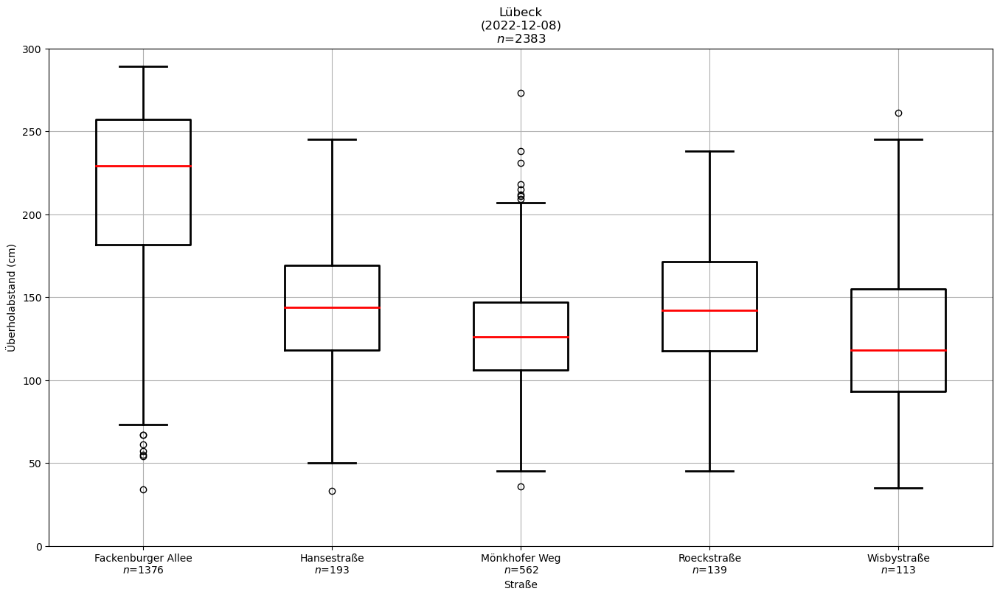

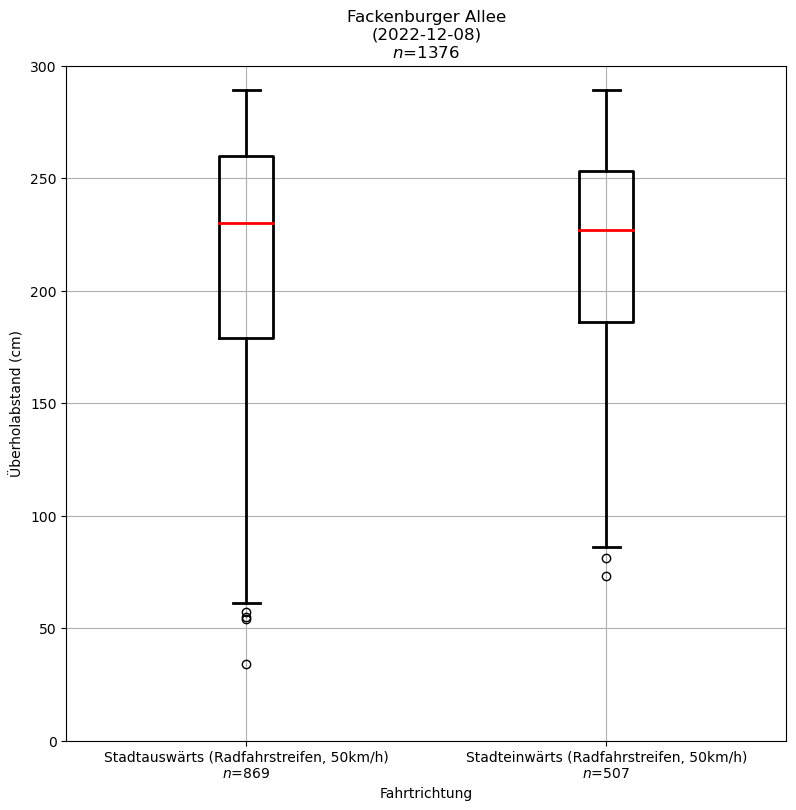

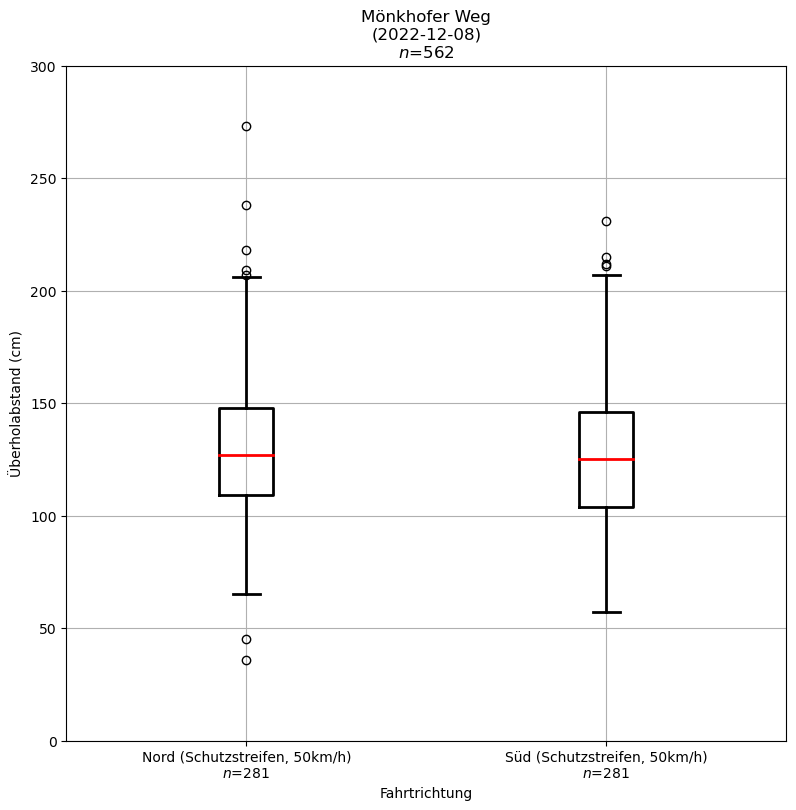

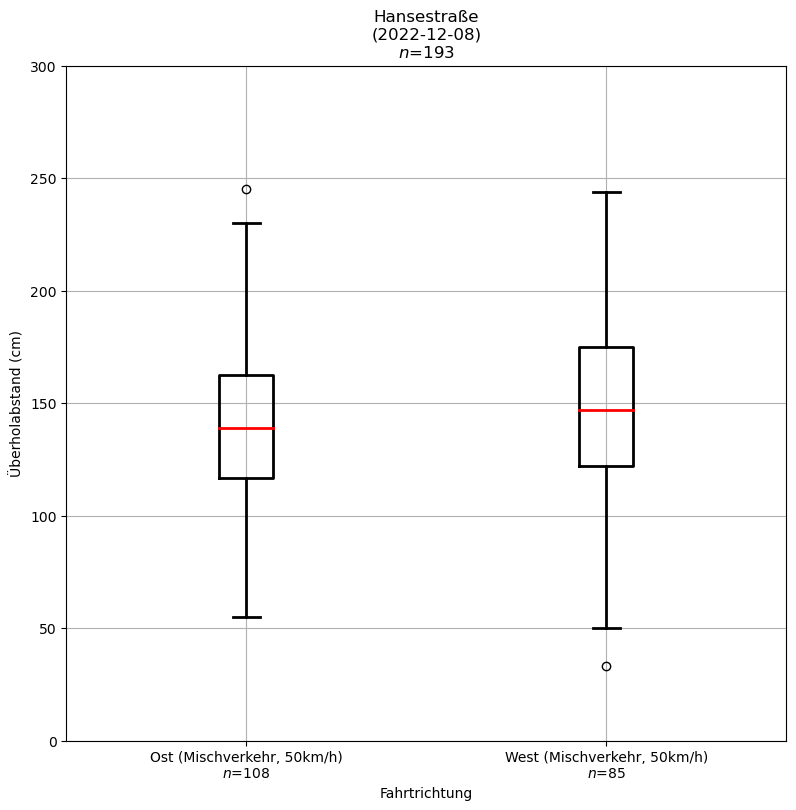

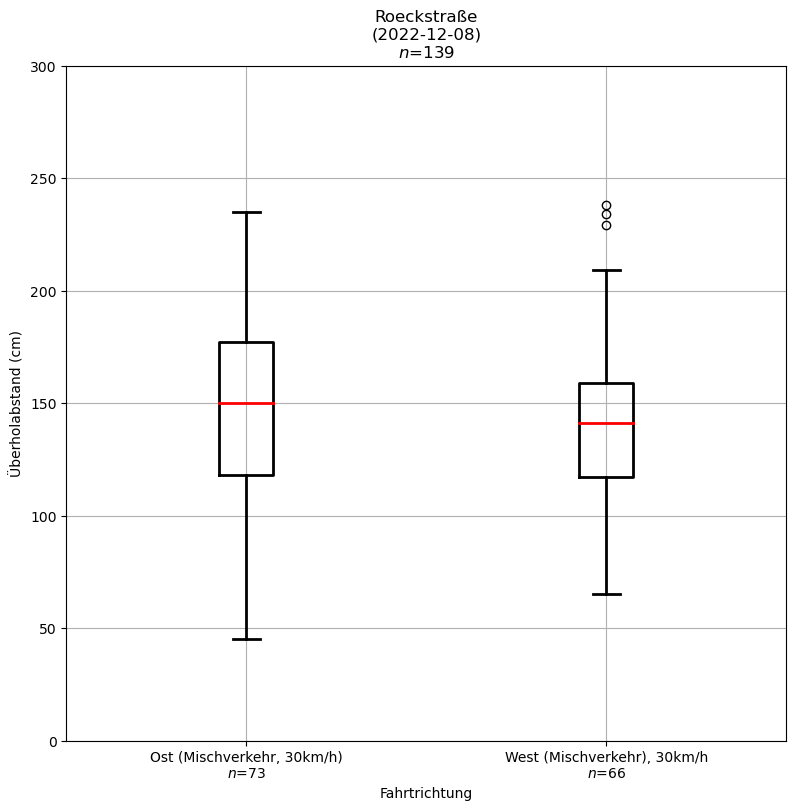

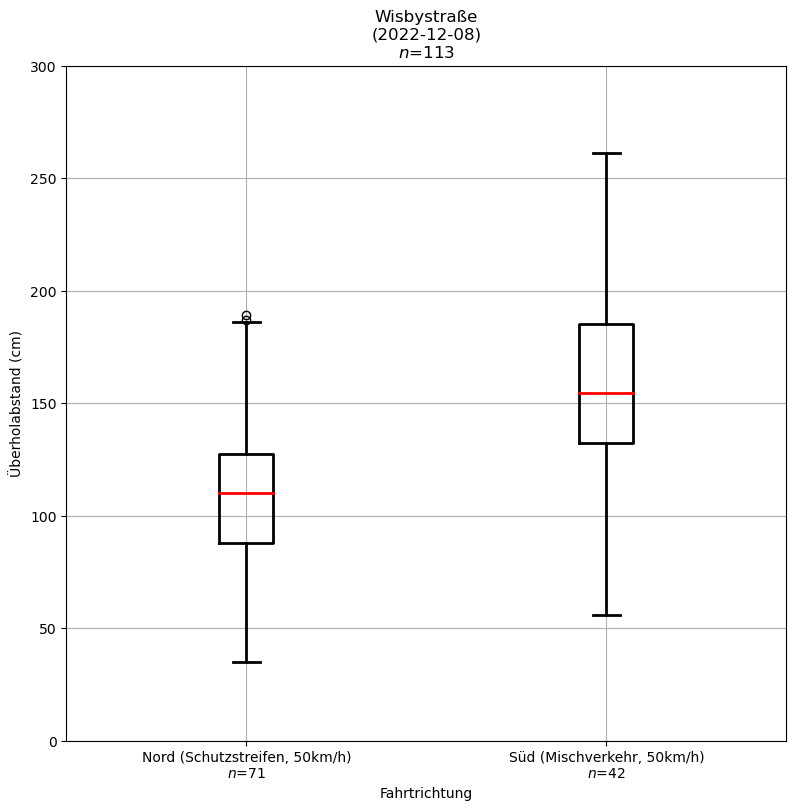

In [20]:
#%%script false --no-raise-error

###################################################################################
# Box plot for left distance
# Hint: Values with distance_stationary = NaN are not used in this plot!
# - https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.boxplot.html
# - https://matplotlib.org/stable/gallery/statistics/boxplot.html
# - https://matplotlib.org/stable/gallery/statistics/boxplot_color.html
###################################################################################

def boxplot_left(gdf, title, by, xlabel, figsize):
    boxplot = gdf.boxplot(
        # Group "distance_overtaker"
        column=['distance_overtaker'],
        # by street/driving_direction
        by=[by],
        # The size of the figure
        figsize=figsize,
        # The colors
        boxprops=dict(linestyle='-', linewidth=2, color='black'),
        medianprops=dict(linestyle='-', linewidth=2, color='red'),
        whiskerprops=dict(linestyle='-', linewidth=2, color='black'),
        capprops=dict(linestyle='-', linewidth=2, color='black'),
        # To remove outliers, uncomment:
        # showfliers=False
    )
    
    # Set title/lable
    boxplot.set_title(title + "\n(" + dateStr + ")\n$n$=" + str(len(gdf)))
    boxplot.get_figure().suptitle("")
    boxplot.set_xlabel(xlabel);
    boxplot.set_ylabel(label_distance_overtaker);
        
    # Add number of observations
    # https://stackoverflow.com/a/29353773/605890   
    boxplot.set_xticklabels(['%s\n$n$=%d'%(k, len(v)) for k, v in gdf.groupby(by)])    
    
    # Ensure, y-axis always up to 300, thus the all boxplots habe the same scale
    plt.ylim(0, 300)

    #  Save the figure
    if(savefig): plt.savefig("output/" + city.name + "_BoxPlot_Street_DistanceLeft_" + title + ".png", dpi=300) 

# Plot "all streets" in one
boxplot_left(obs_geojson[obs_geojson.street != "n/a"], city.name, "street", label_street, figsize_rect);

# Plot "diriving directions" for all pre-defined streets
for s in city.streets:
    boxplot_left(obs_geojson[obs_geojson.street == s.name], s.name, 'driving_direction', label_driving_direction, figsize_square);

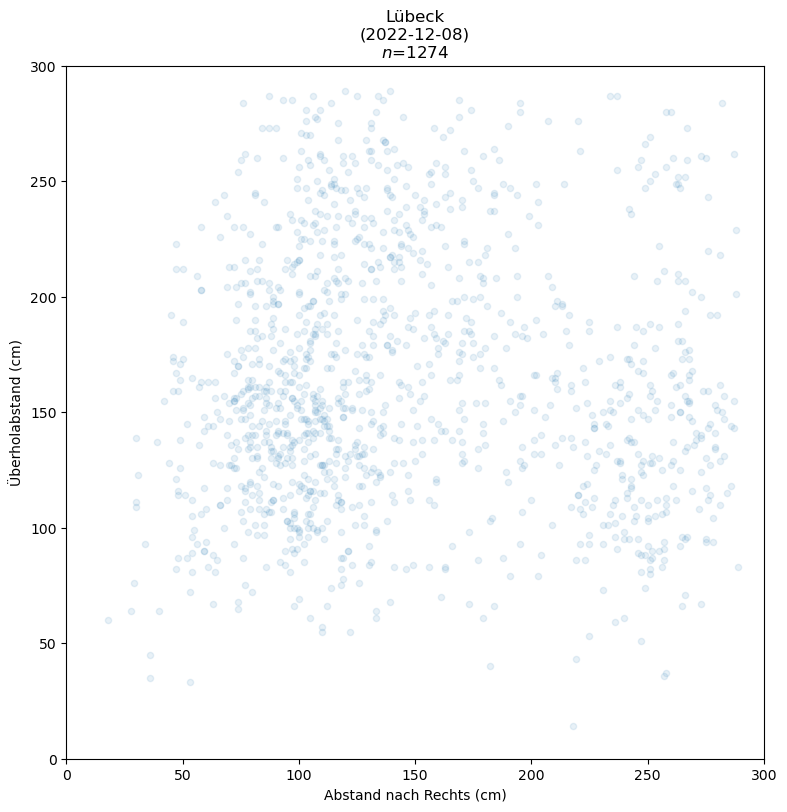

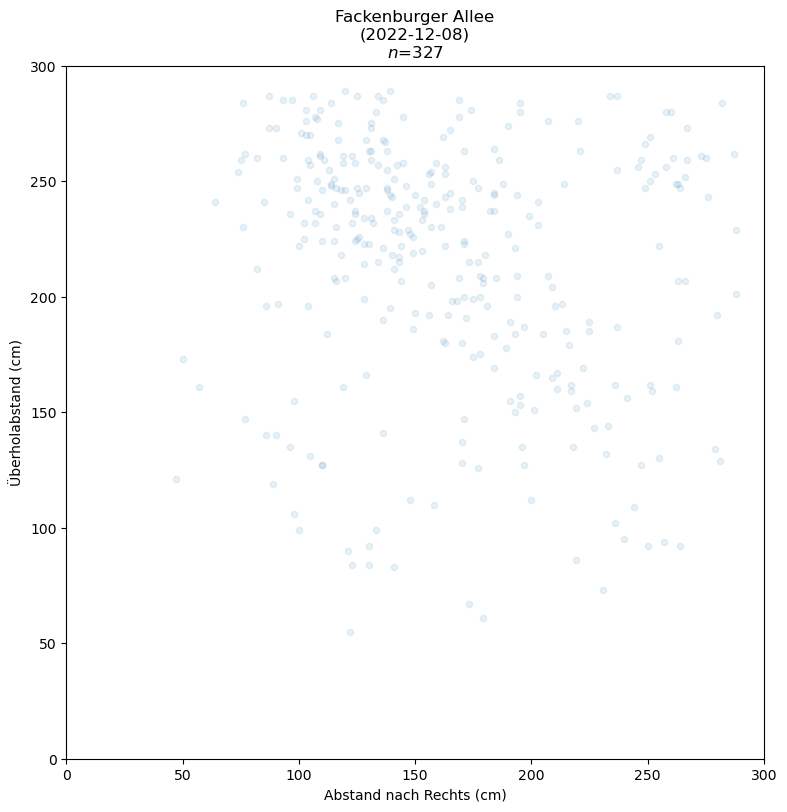

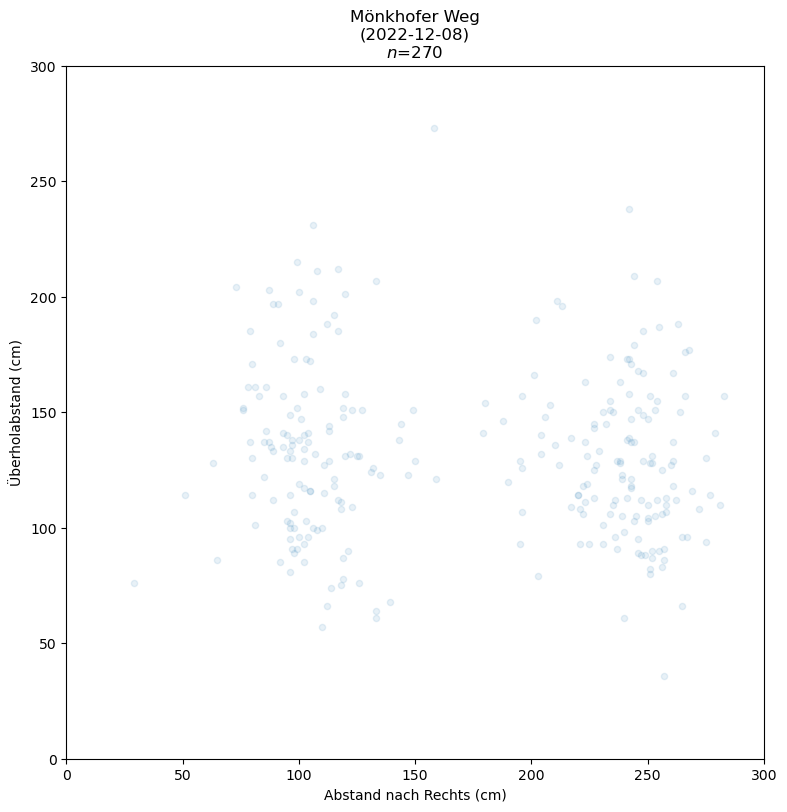

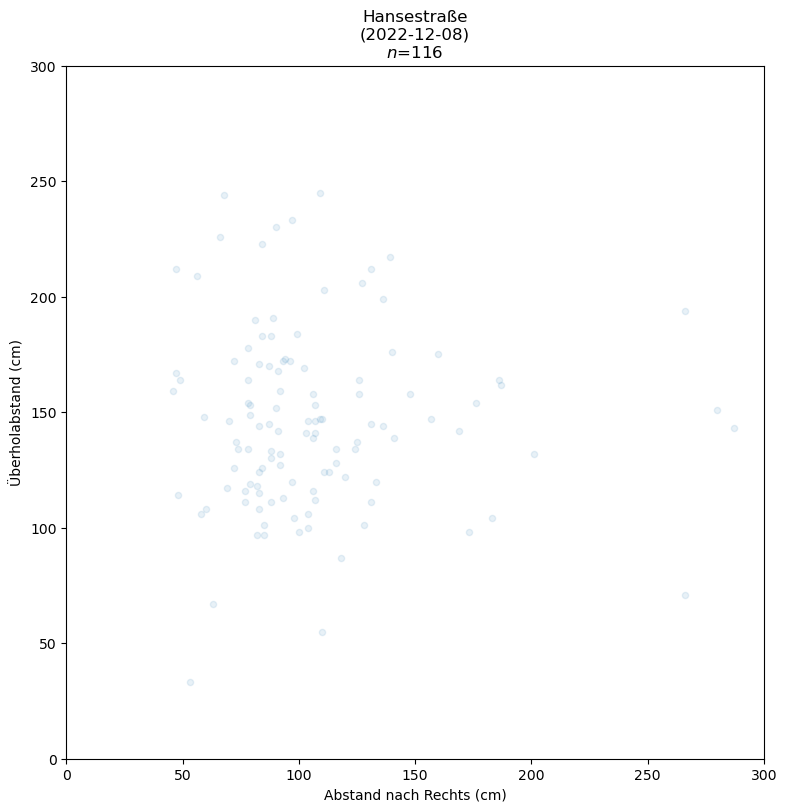

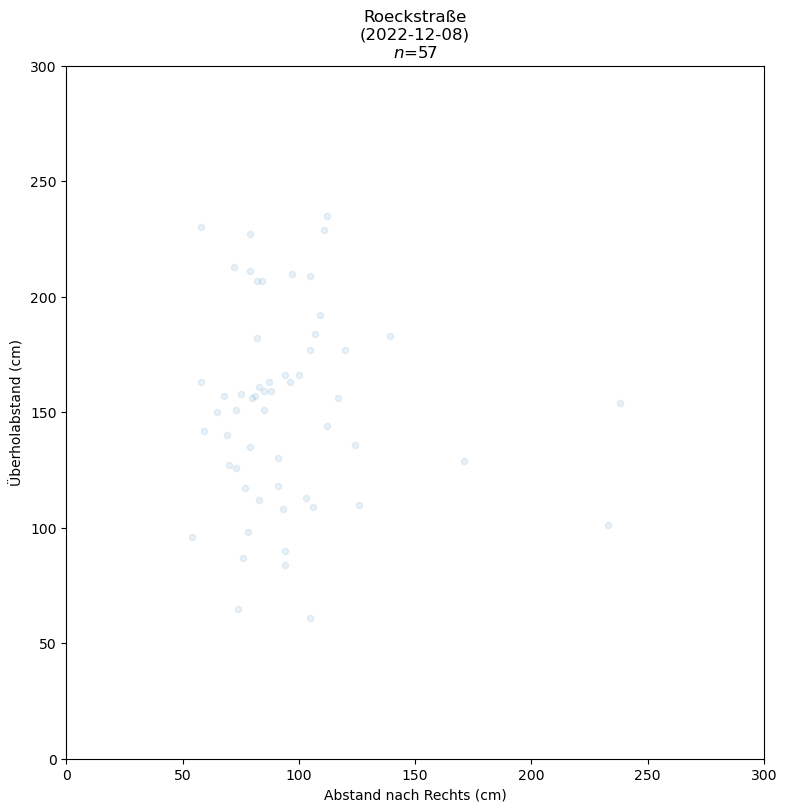

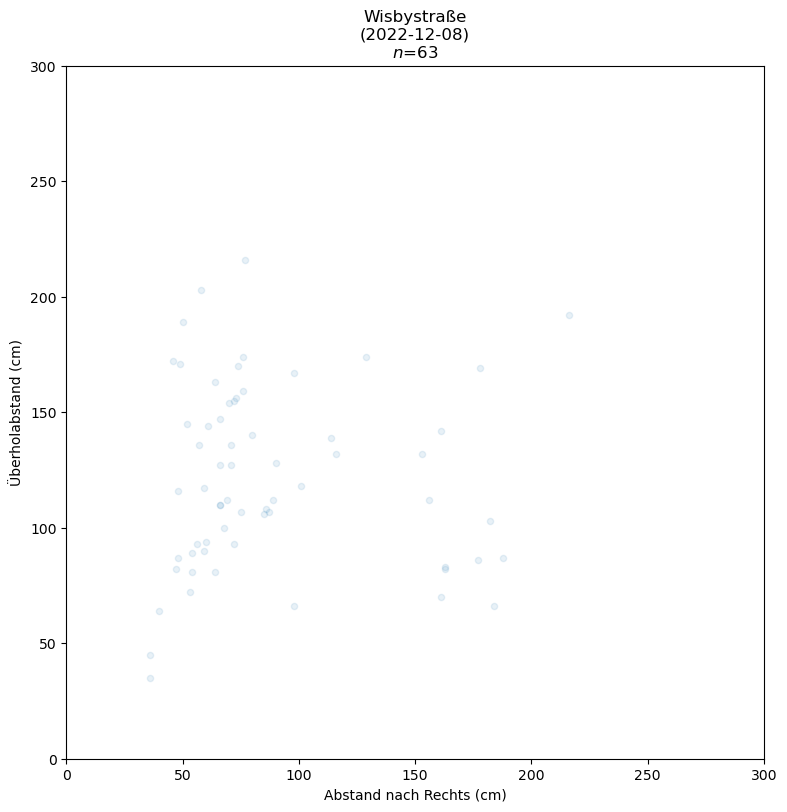

In [21]:
#%%script false --no-raise-error

###################################################################################
# Scatter plot for right/left
###################################################################################

def scatter_right_left(gdf, title):
    # Ensure, left and right are greater than 10cm
    gdf = gdf[(gdf['distance_stationary']>10) & (gdf['distance_overtaker']>10)].copy()
    axes = gdf.plot(
        kind='scatter',
        # Define the tow colums to plot
        y='distance_overtaker',
        x='distance_stationary',
        # 10% opacity for each point
        alpha=0.1,
        # The size
        figsize=figsize_square
    )
    # Set title/label
    axes.set_title(title + "\n(" + dateStr + ")\n$n$=" + str(len(gdf)))
    axes.set_xlabel(label_distance_stationary);
    axes.set_ylabel(label_distance_overtaker);  
    
    # Ensure that all scatter plot have the same scale
    plt.xlim(0, 300)
    plt.ylim(0, 300)
    
    # Save the plot
    if(savefig): plt.savefig("output/" + city.name + "_ScatterPlot_DistanceRight_DistanceLeft_" + title + ".png", dpi=300)     
    plt.show()

# Create plot for all data point
scatter_right_left(obs_geojson, city.name)

# Create plot for each pre-defined street
for s in city.streets:
    scatter_right_left(obs_geojson[obs_geojson.street == s.name], s.name)

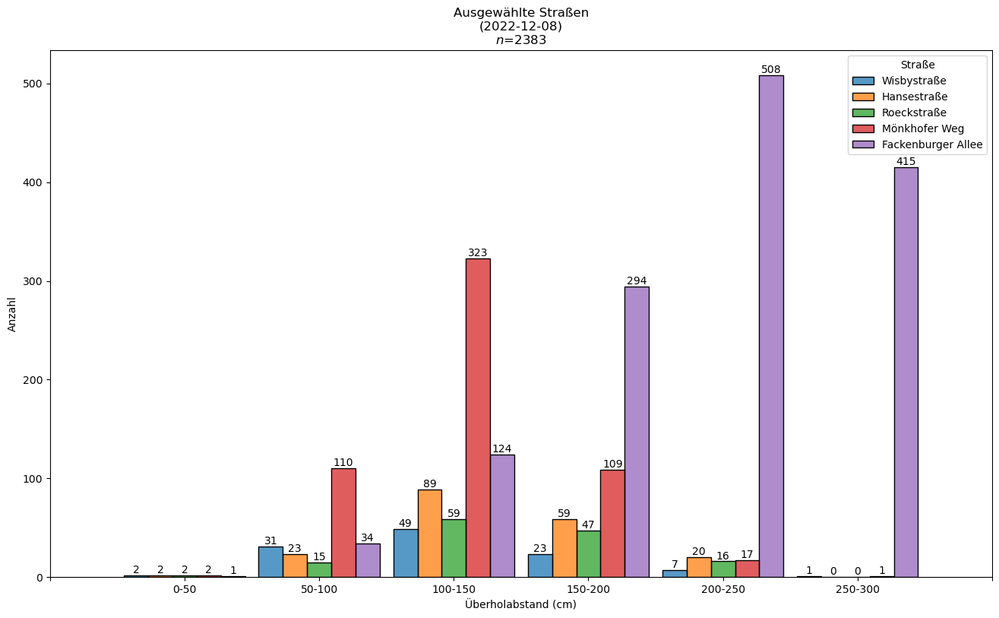

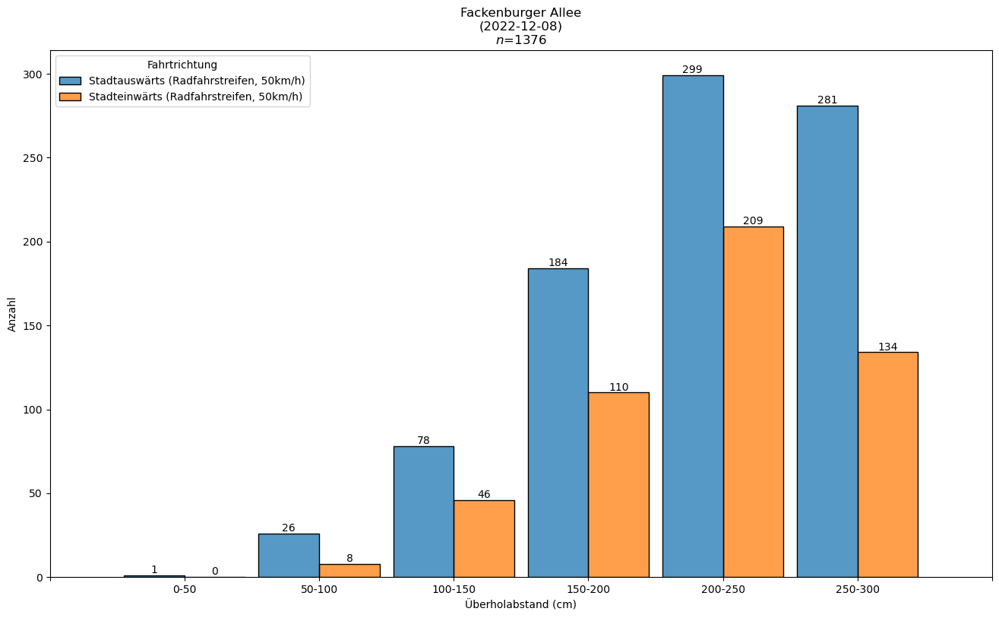

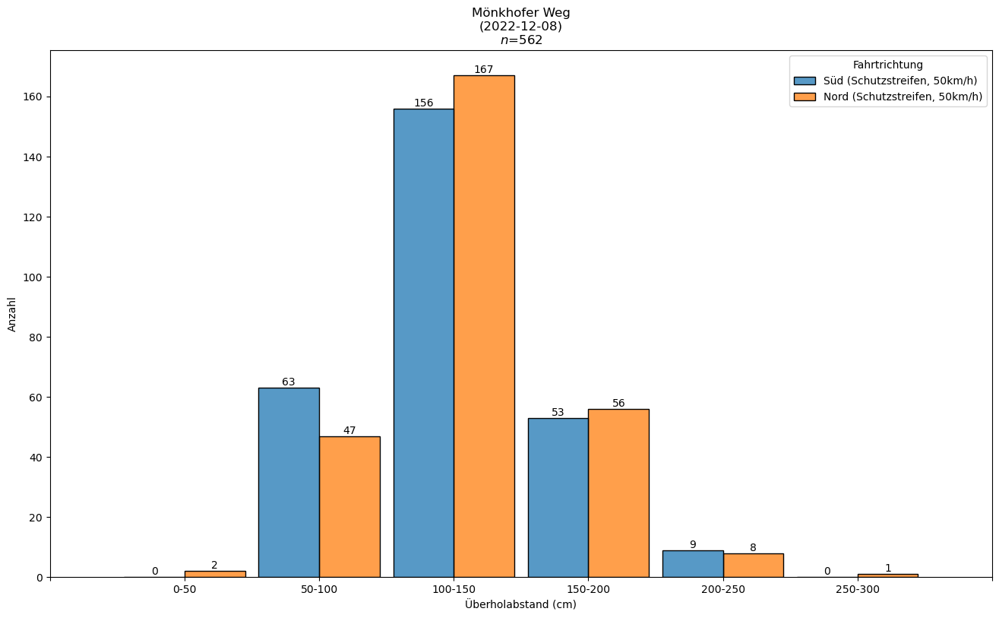

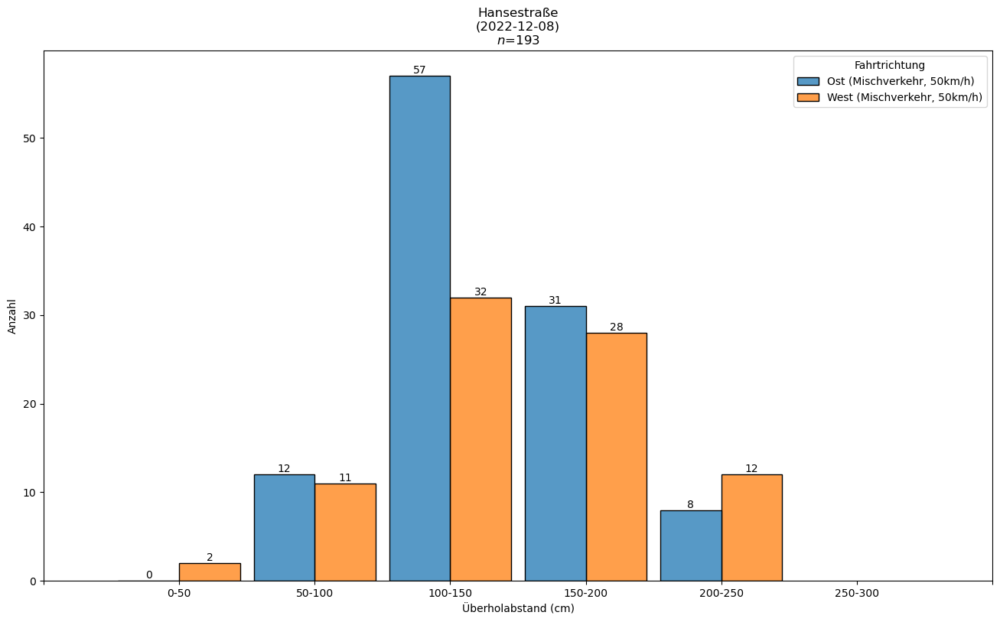

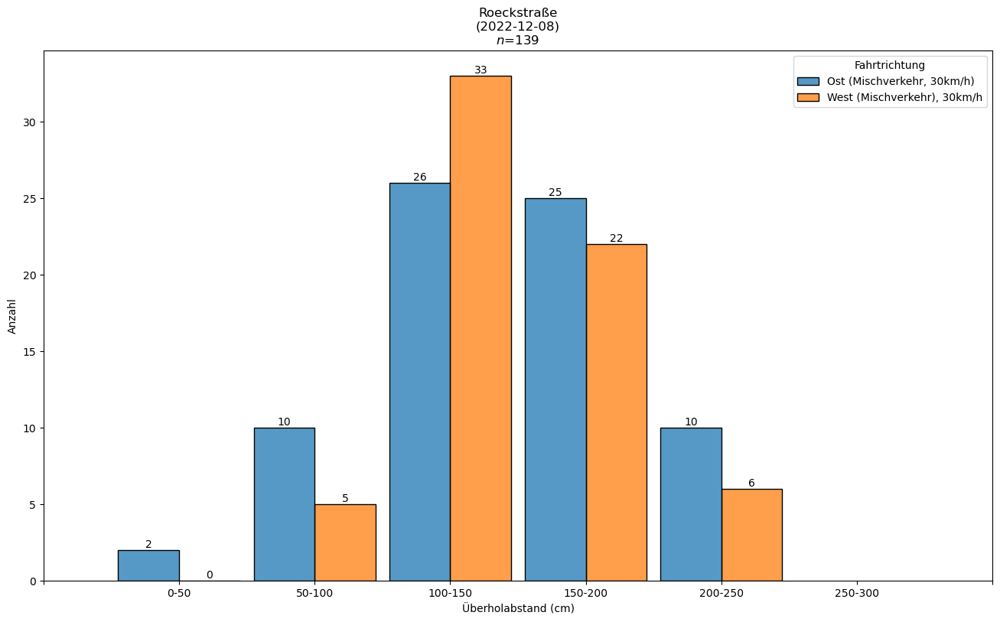

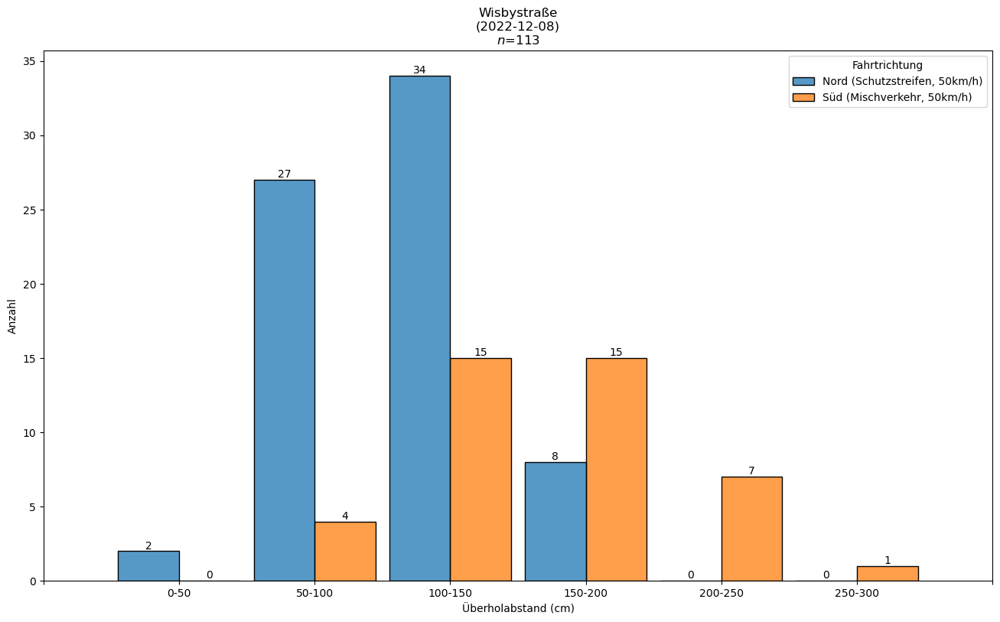

In [22]:
#%%script false --no-raise-error

###################################################################################
# Histogram
#
# https://stackoverflow.com/questions/60046243/how-to-make-a-distplot-for-each-column-in-a-pandas-dataframe
# https://seaborn.pydata.org/generated/seaborn.histplot.html
###################################################################################

def hist_left(gdf, title, hue):
    gdf = gdf.copy()
    # Ensure order
    gdf['left_label'] = gdf['left_label'].astype(pd.CategoricalDtype(left_labels , ordered=True))
    # Filter all streets with n/a
    gdf = gdf[(gdf['street'] != "n/a")]
    
    # This is used as Title in the legend !!!
    gdf["Straße"] = gdf['street']
    gdf["Fahrtrichtung"] = gdf['driving_direction']
      
    # Create plot
    fig, ax = plt.subplots(
        figsize=figsize_rect
    )
    
    # FIXME: Color order wrong
#    colors = []
#    for s in city.streets:
#        colors.append(s.color)
#    sns.set_palette(colors)

    # Create plot
    g = sns.histplot(
        ax=ax,
        data=gdf,
        # plot by left_label
        x='left_label',
        bins=left_labels,
        # Make the box-groups 90% wide
        shrink=0.9,
        # variable that is mapped to determine the color of plot elements
        hue=hue,
        # Put the colums close to each other
        multiple="dodge",
        # Show the legend
        legend=True
    )
    
    # Title / Label
    ax.set_title(title+"\n(" + dateStr + ")\n$n$=" + str(len(gdf)));
    ax.set_xlabel(label_distance_overtaker);
    ax.set_ylabel(label_counter);
    
    # Ensure, also empty bins are shown, e.g., 250-300 can be empty
    x_ticks = ax.get_xticks();
    x_ticks.append(len(x_ticks))
    x_ticks.insert(0, -1)
    ax.set_xticks(x_ticks)
   
    # Add count to each bar
    for bars in ax.containers:
        ax.bar_label(bars)

    # Save
    if(savefig): plt.savefig("output/" + city.name + "_HistogramPlot_DistanceLeft_" + title + ".png", dpi=300)
    plt.show()

# Print all pre-defined streets
hist_left(obs_geojson, label_selected_street, label_street);

# Print for each pre-defined street
for s in city.streets:
    hist_left(obs_geojson[obs_geojson.street == s.name], s.name, label_driving_direction);
    

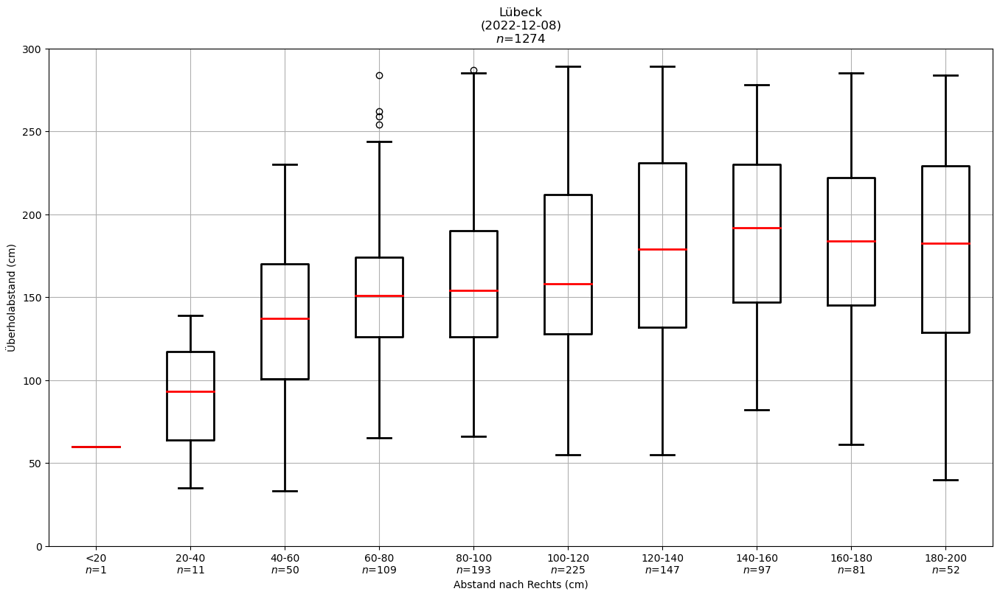

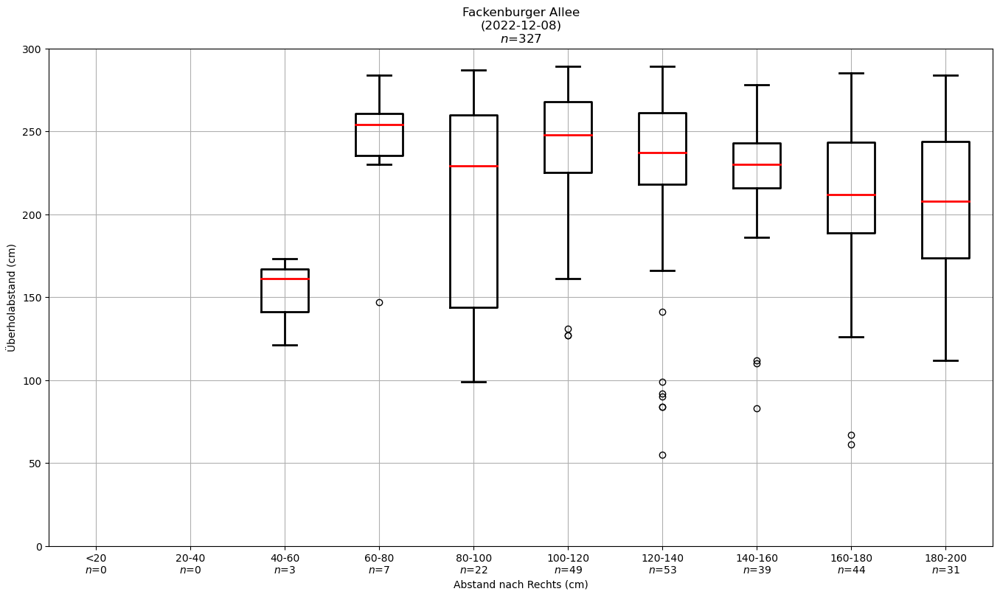

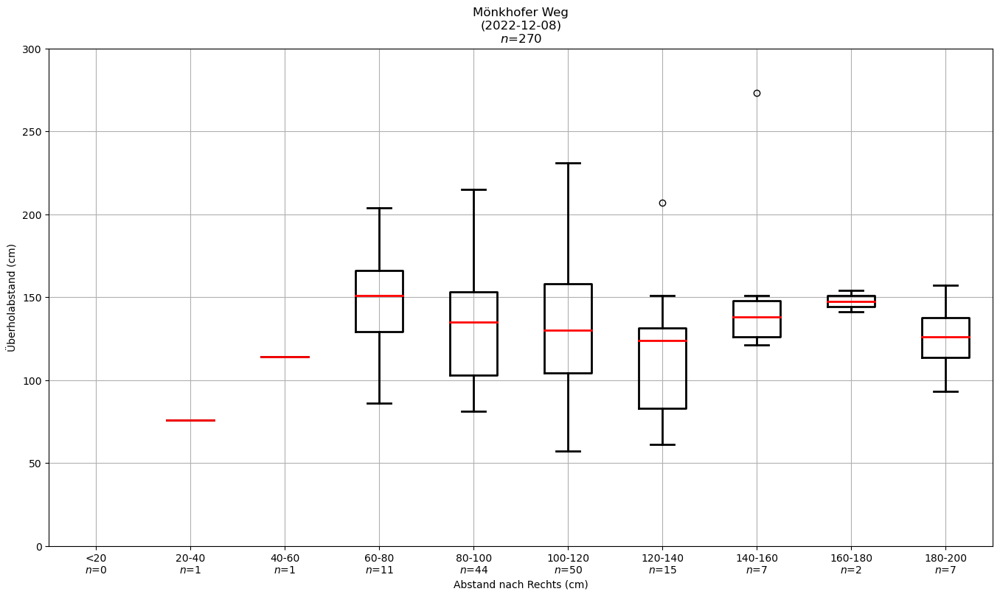

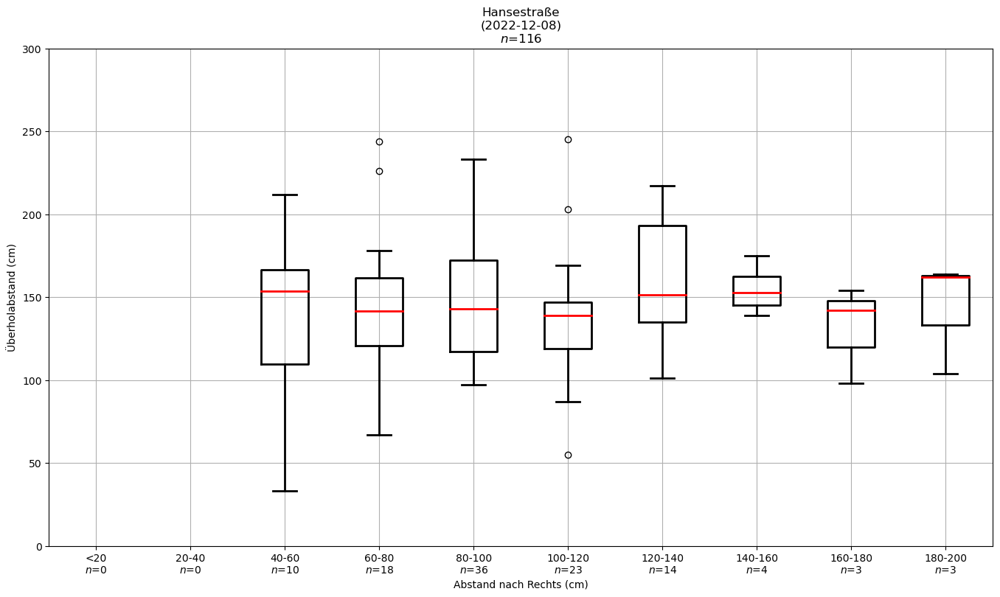

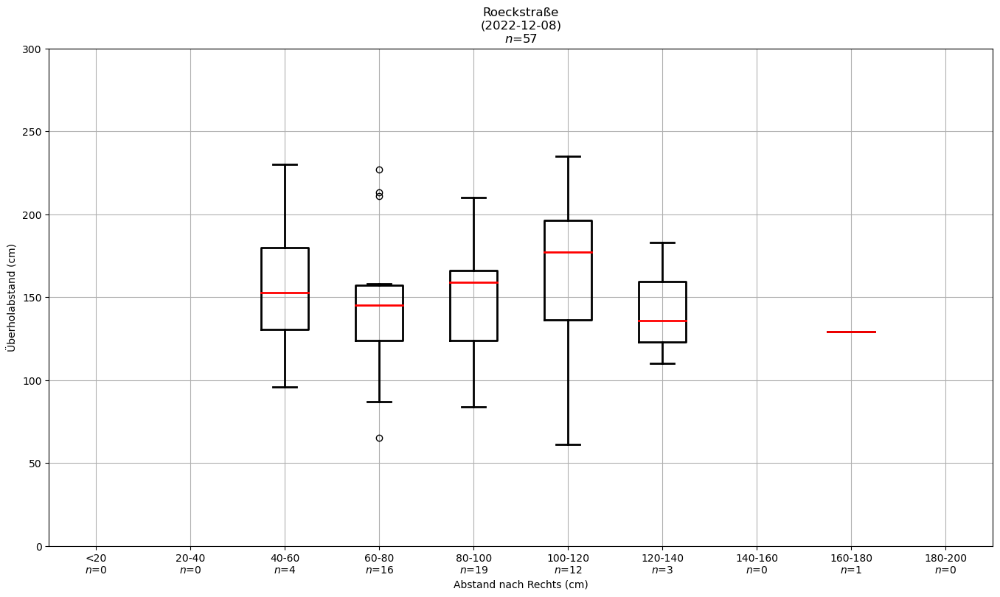

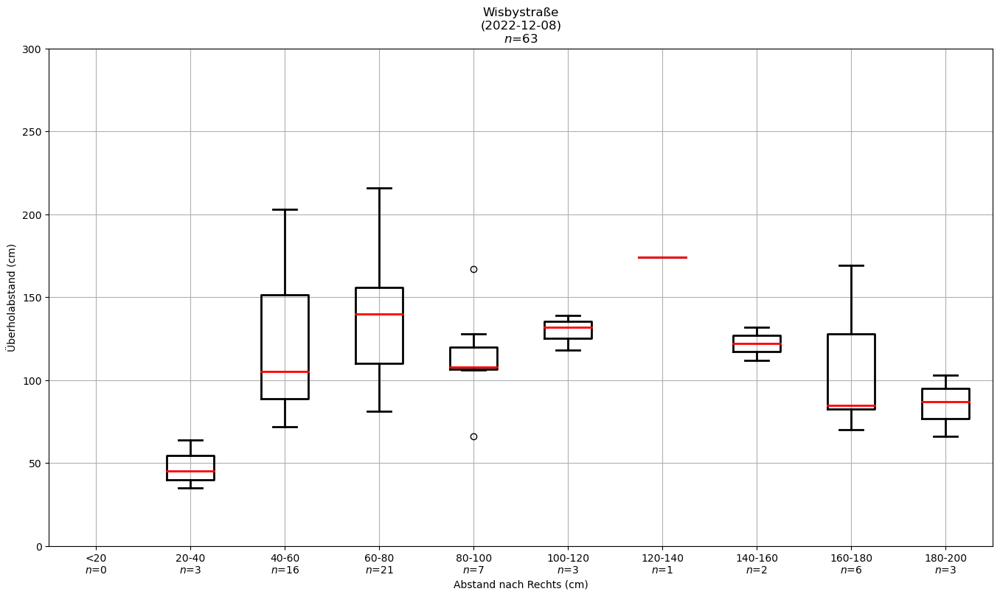

In [25]:
#%%script false --no-raise-error

###################################################################################
# Box plot for right/left
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.boxplot.html
###################################################################################

def boxplot_right_left(gdf, title):
    # Group by
    by = 'Right_binned_label';
    # Ensure, left and right are greater than 10cm
    gdf = gdf[(gdf['distance_stationary']>10) & (gdf['distance_overtaker']>10)].copy()
    # Format data
    gdf['Right_binned_label'] = pd.cut(gdf['distance_stationary'], right_bins, labels=right_labels)
    # Ensure order
    gdf['Right_binned_label'] = gdf['Right_binned_label'].astype(pd.CategoricalDtype(right_labels , ordered=True))
    
    # Plot data
    boxplot = gdf.boxplot(
        # plot columns...
        column=['distance_overtaker'],
        # by...
        by=[by],
        # Size
        figsize=figsize_rect,
        # Colors
        boxprops=dict(linestyle='-', linewidth=2, color='black'),
        medianprops=dict(linestyle='-', linewidth=2, color='red'),
        whiskerprops=dict(linestyle='-', linewidth=2, color='black'),
        capprops=dict(linestyle='-', linewidth=2, color='black'),
    )
    
    # Label plot
    boxplot.set_title(title + "\n(" + dateStr + ")\n$n$=" + str(len(gdf)))
    boxplot.get_figure().suptitle("")
    boxplot.set_xlabel(label_distance_stationary);
    boxplot.set_ylabel(label_distance_overtaker);
    
    # Add number of observations
    # https://stackoverflow.com/a/29353773/605890
    boxplot.set_xticklabels(['%s\n$n$=%d'%(k, len(v)) for k, v in gdf.groupby(by)])        
    
    plt.ylim(0, 300)
    if(savefig): plt.savefig("output/" + city.name + "_BoxPlot_DistanceRight_DistanceLeft_" + title + ".png", dpi=300)     
    plt.show()

    
boxplot_right_left(obs_geojson, city.name);

for s in city.streets:
    boxplot_right_left(obs_geojson[obs_geojson.street == s.name], s.name);


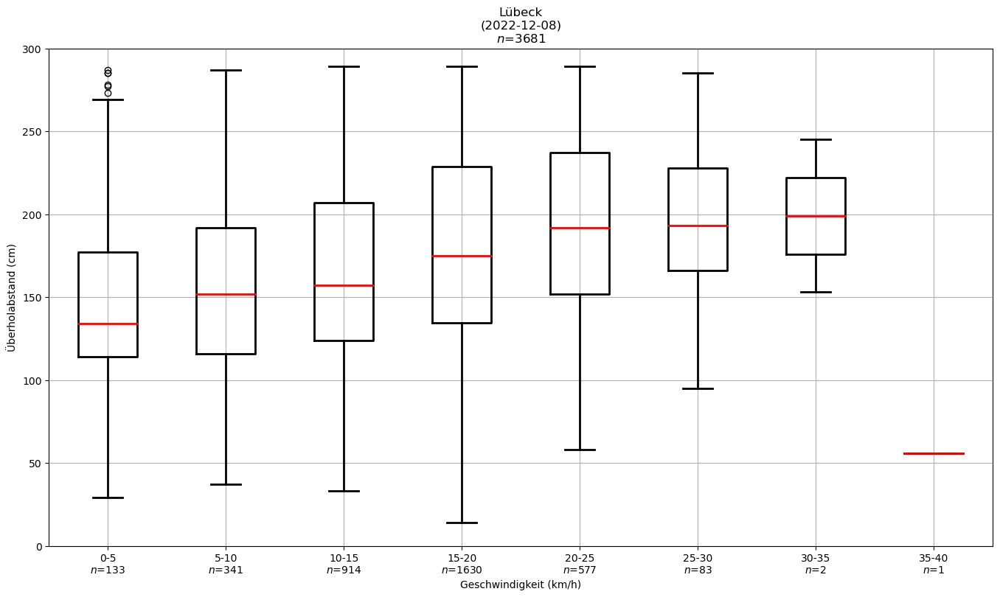

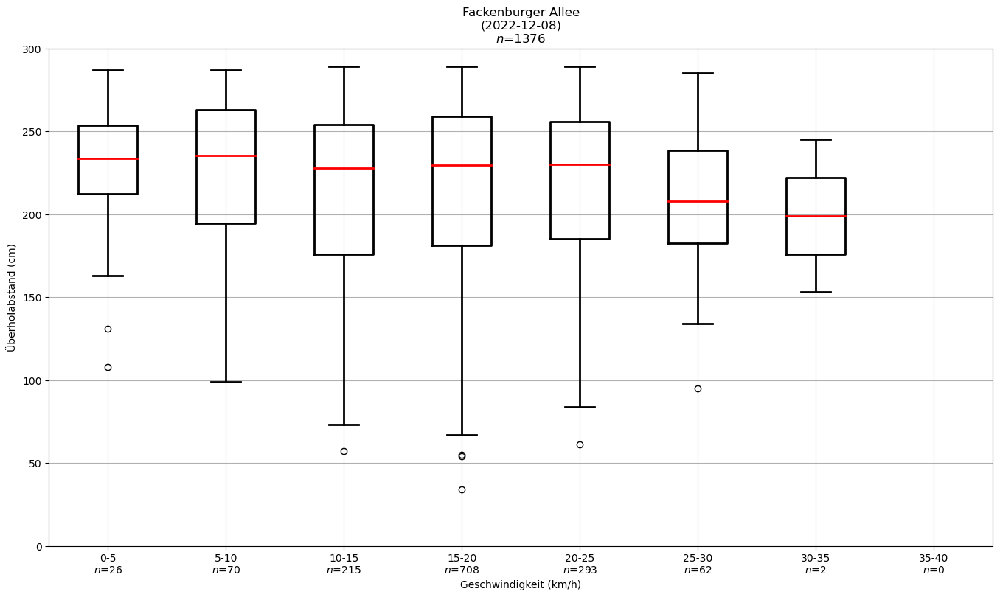

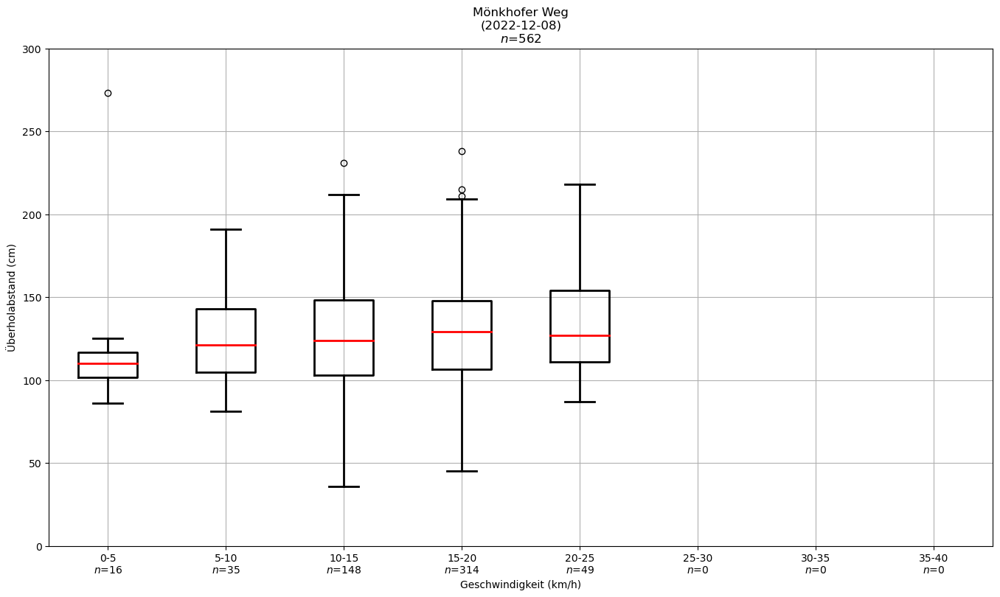

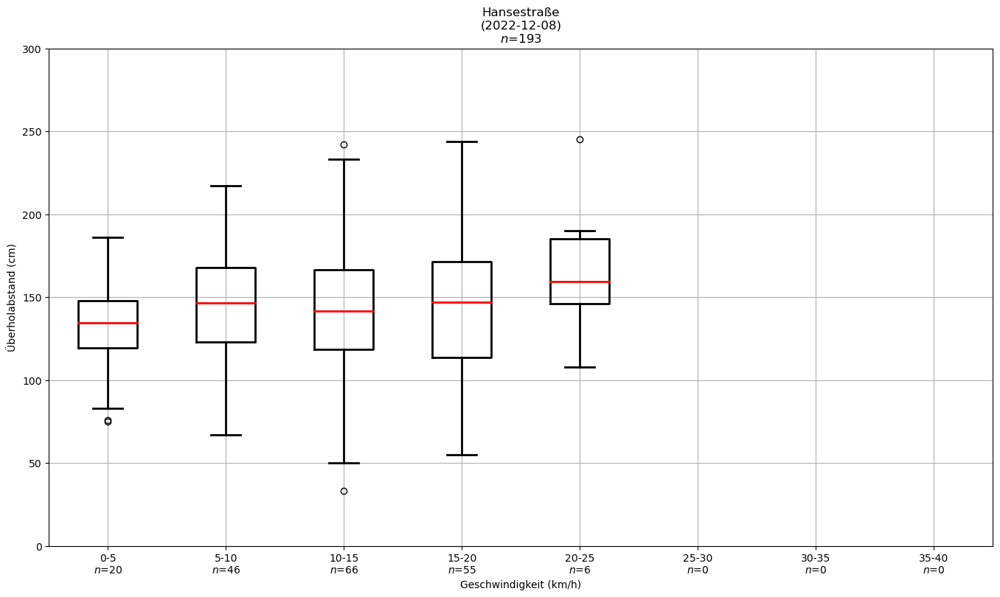

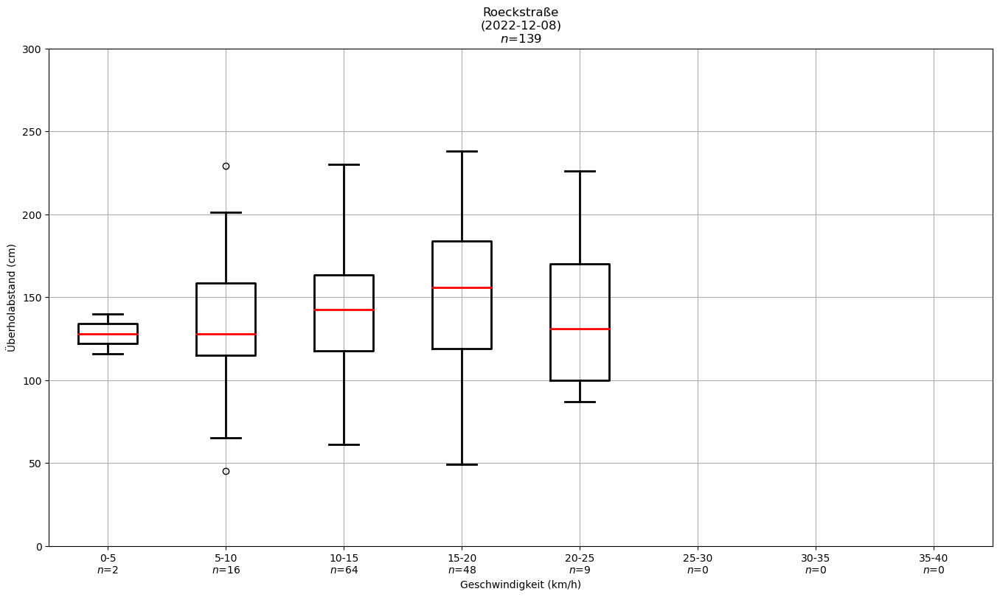

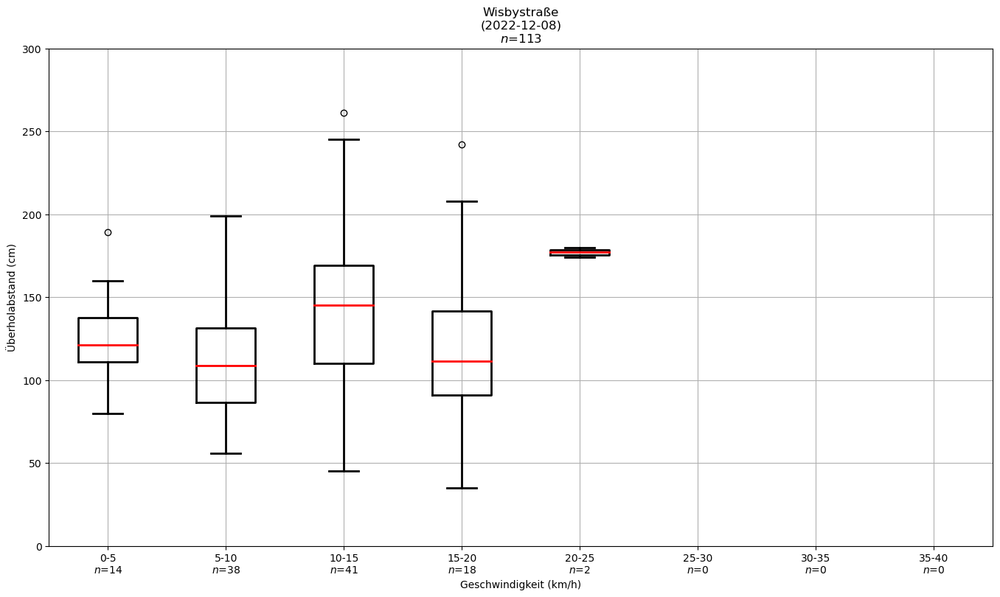

In [26]:
#%%script false --no-raise-error

###################################################################################
# Box plot for speed_kmh + left
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.boxplot.html
###################################################################################

def boxplot_speed_kmh_left(gdf, title):
    gdf = gdf.copy()
    # Group by
    by = 'speed_kmh_label';
    # Order by
    gdf['speed_kmh_label'] = gdf['speed_kmh_label'].astype(pd.CategoricalDtype(speed_labels , ordered=True))    
    
    boxplot = gdf.boxplot(
        # plot columns...
        column=['distance_overtaker'],
        # by...
        by=[by],
        # Size
        figsize=figsize_rect,
        # Colors
        boxprops=dict(linestyle='-', linewidth=2, color='black'),
        medianprops=dict(linestyle='-', linewidth=2, color='red'),
        whiskerprops=dict(linestyle='-', linewidth=2, color='black'),
        capprops=dict(linestyle='-', linewidth=2, color='black'),
    )
    
    # Label plot
    boxplot.set_title(title + "\n(" + dateStr + ")\n$n$=" + str(len(gdf)))
    boxplot.get_figure().suptitle("")
    boxplot.set_xlabel(label_speed);
    boxplot.set_ylabel(label_distance_overtaker);
    
    # Add number of observations
    # https://stackoverflow.com/a/29353773/605890
    boxplot.set_xticklabels(['%s\n$n$=%d'%(k, len(v)) for k, v in gdf.groupby(by)])            
    
    # Ensure, y-axis always up to 300, thus the all boxplots habe the same scale
    plt.ylim(0, 300)
    
    # Save
    if(savefig): plt.savefig("output/" + city.name + "_BoxPlot_Speed_DistanceLeft_" + title + ".png", dpi=300)     
    plt.show()

# Plot whole city
boxplot_speed_kmh_left(obs_geojson, city.name);

# Plot for each pre-defined street
for s in city.streets:
    boxplot_speed_kmh_left(obs_geojson[obs_geojson.street == s.name], s.name);

#obs_geojson[obs_geojson.speed_kmh_label == "0-5"]